In [1664]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json

import os
import sys
sys.path.insert(1, os.path.join(sys.path[0], '..'))  # Add the src directory to path 
from src.utils import tight_bbox, parse_lipid
from src.plots import plot_quant_vs_ogtt, set_square_ratio

plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['pdf.use14corefonts'] = True
plt.rcParams['axes.unicode_minus'] = False  # https://stackoverflow.com/questions/43102564/matplotlib-negative-numbers-on-tick-labels-displayed-as-boxes
plt.style.use('seaborn-ticks')  # 'seaborn-ticks'

import importlib
from pathlib import Path

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_squared_log_error

from statsmodels.api import formula as smf

Num features: 2758
Num IDs 432


,Retention Time (min),Quant Ion,Polarity,Area (max),Identification,Lipid Class,Features Found,1700s_extract_blank_rep1,1700s_extract_blank_rep2,1700s_extract_blank_rep3,...,1743_33_RBG,1746_30_RBG,1746_31_RBG,1746_32_RBG,1748_29_RBG,1748_30_RBG,1748_31_RBG,1754_30_RBG,1754_31_RBG,1754_32_RBG
vl_5,0.701,329.02988,-,30.633115,NaN,NaN,31,14.226381,14.213035,16.011224,...,29.219119,28.528580,28.846520,28.919200,28.941543,28.352097,28.882312,28.930761,29.521106,28.917133
vl_6,0.703,287.05676,+,25.219560,NaN,NaN,51,13.891960,13.875591,13.951897,...,24.088742,24.188917,24.657105,24.511321,24.594522,23.974765,24.017312,24.561615,24.549629,24.244110
vl_11,0.706,247.09293,-,27.628314,NaN,NaN,53,14.076268,14.972670,14.172502,...,25.291583,25.155756,25.021441,25.177094,25.654629,24.603506,25.213348,25.395430,25.811074,24.964996
vl_12,0.706,645.10980,+,27.606511,NaN,NaN,36,13.684595,13.668225,13.744531,...,25.047341,25.322980,26.184084,25.238848,25.341024,24.455754,24.800951,25.546878,25.666994,24.981537
vl_14,0.708,623.13934,+,28.710186,NaN,NaN,16,13.764542,13.748172,13.824478,...,21.660762,21.963660,22.548782,22.239775,22.389395,21.822263,21.893265,22.374278,21.980068,21.795407
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vl_6486,20.822,1021.86597,+,23.836821,NaN,NaN,58,16.748494,16.705757,16.712849,...,18.930546,22.457354,22.985264,22.035020,22.266866,22.040497,23.145115,21.155786,18.230559,20.292170
vl_6487,20.833,943.81781,+,23.572909,NaN,NaN,35,21.889222,22.072254,19.384428,...,20.194889,21.140060,22.622691,20.788522,21.264119,21.213970,22.910187,20.887033,19.472573,20.485366
vl_6488,20.835,923.85229,+,24.011567,NaN,NaN,43,18.616348,18.442698,18.550770,...,18.607779,22.672094,22.694375,20.657838,21.786579,22.145899,22.909474,23.193032,19.331390,21.469666
vl_6489,20.838,565.56018,+,22.473276,NaN,NaN,32,16.793684,16.750947,16.758039,...,16.850232,19.229094,20.966809,18.998586,20.414395,21.495040,21.420139,21.718895,17.624333,18.166094


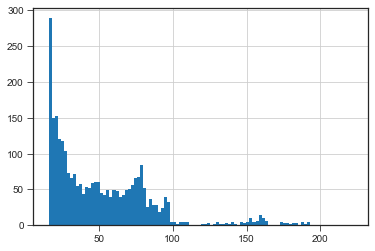

In [1703]:
colors = json.load(open(r'..\data\metadata\color_schemes.json'))
compound_superclasses = json.load(open('../data/metadata/compound_superclasses.json', 'r'))
    
data = pd.read_csv(r'../data/processed/combined_metabolites_data_with_model_params.csv').set_index('i')

fg = pd.read_csv(r'..\data\metadata\combined_metab_lipid_file_grouping.csv', index_col=0)
ap = pd.read_excel(r'..\data\metadata\animal_phenotypes.xlsx', index_col=0)

fr = pd.read_csv('../data/interim/Final_Results_validation.csv')
fr = fr.drop(fr.filter(regex='Unnamed').columns, axis=1)
# Log2 transform
fr.loc[:, fr.filter(regex='.raw').columns] = np.log2(fr.loc[:, fr.filter(regex='.raw').columns])
fr['Area (max)'] = np.log2(fr['Area (max)'])
# rename to shorter column names
combined_col_names = {fr_name: combined_name for fr_name, combined_name in zip(fg['fr_name'], fg.index)}
fr.rename(combined_col_names, axis=1, inplace=True)

# make string index for each lipid. vl_ = Validation Lipid
fr.index = 'vl_' + fr.index.astype('str')

qc_rep_1700s = fg.loc[fg['qc_rep']].index
quant_files_1700s = fg.loc[(fg['cohort'] == '30wk') & (fg['has_ogtt'])].index

# Perform most basic filter: Features Found > X:
fr = fr.loc[fr['Features Found'] > 15]
fr['Features Found'].hist(bins=100)
print('Num features:', len(fr))
print('Num IDs', len(fr.loc[fr['Identification'].notna()]))

# FILTER OUT ALL 1000s FILES AND SAMPLES WITHOUT OGTT
validation_10wk_files = fg.loc[(fg['cohort'] == '10wk') & (fg['validation'])].index
fr = fr.drop(validation_10wk_files, axis=1)
fr = fr.drop(fr.filter(regex='1000s').columns, axis=1)
fr = fr.drop(fg.loc[(fg['ogtt'].isna()) & fg['quant_file']].index, axis=1)
fr

## PCA on all 30wk files (QCs, blanks, and all 30wk with OGTT values) 

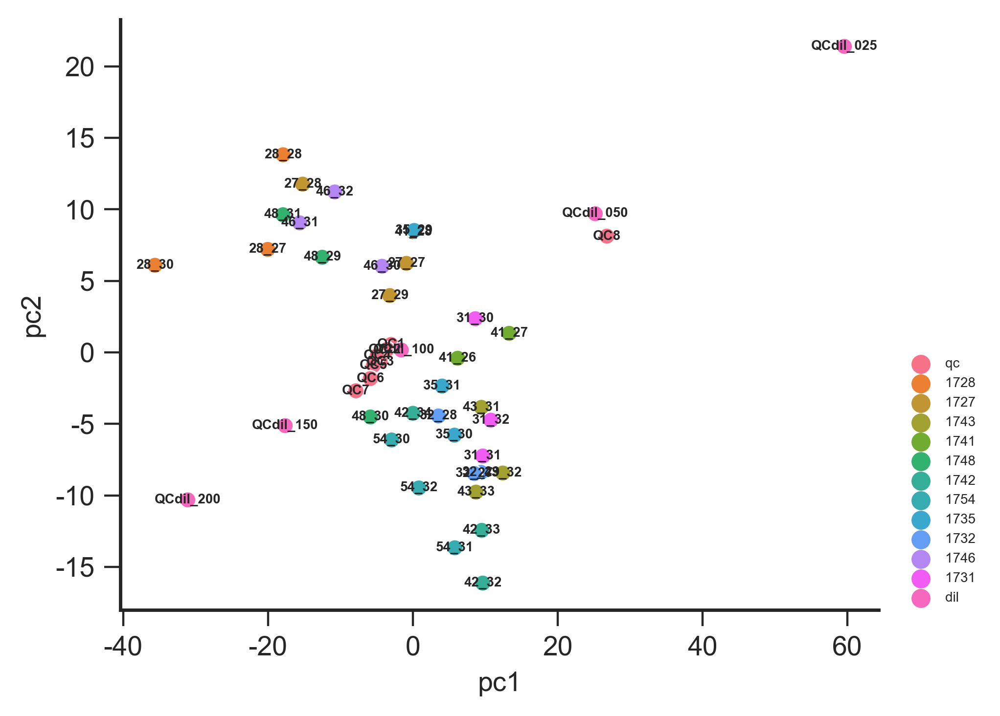

In [1666]:
files = fg.loc[(fg['cohort'] == '30wk') & \
               (fg['ogtt'].notna() 
                | fg['qc_rep'] 
                | fg['qc_dilution'] 
#                 | fg['blank_file']
               )
              ].index


df = fr.loc[:, files].T
df = fr.loc[fr['Identification'].notna(), files].T
df = pd.DataFrame(StandardScaler().fit_transform(df.values), index=df.index, columns=df.columns)
df
pca = pd.DataFrame(PCA().fit_transform(df), index=df.index, columns=[f'pc{x}' for x in range(1, len(df)+1)])
pca = pca.join(fg[['animal', 'lipid_run_order']])
pca = pca.sort_values('lipid_run_order')

pcx = 'pc1'
pcy = 'pc2'
fig, ax = plt.subplots(dpi=400, figsize=(5, 4))
sns.scatterplot(
    data=pca, x=pcx, y=pcy, hue='animal', ax=ax,
)

prevx, prevy = 0, 0
for i, row in pca.iterrows():
    
    if 'RBG' in i:
#         continue
        i = i[2:7]
#         ax.plot((prevx, row[pcx]), (prevy, row[pcy]), color='gray', zorder=-10)
#         prevx, prevy = row[pcx], row[pcy]
    if '1700s' in i:
        i = i[6:]
    ax.text(row[pcx], row[pcy], i, ha='center', va='center', fontsize=5, fontweight='bold')
    
ax.legend(loc=(1.03, 0), fontsize=5)
sns.despine()

## Run order boxplots

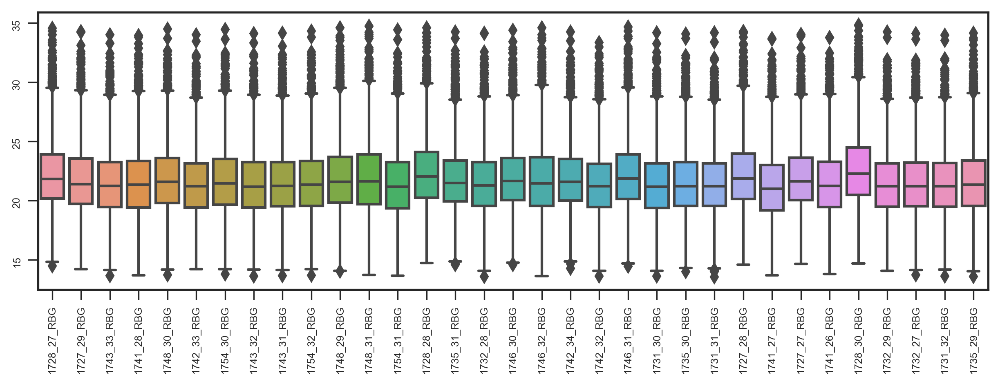

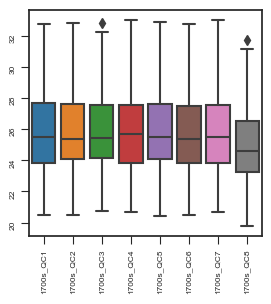

In [1758]:
run_order = fg.loc[(fg['cohort'] == '30wk') & (fg['has_ogtt']), 
                   'lipid_run_order'].sort_values().index
all_run_order = fg.loc[(fg['cohort'] == '30wk') 
                       & (fg['has_ogtt']) 
                       | (fg['qc_rep']), 
                       'lipid_run_order'].sort_values().index
df = fr.loc[:, run_order]

fig, ax = plt.subplots(dpi=300, figsize=(10, 3))
sns.boxplot(
    data=df, ax=ax,
)
ax.tick_params(rotation=90, labelsize=6)


# df = fr.loc[fr['Identification'].notna(), qc_rep_1700s]
df = fr.loc[fr['Lipid Class'] == 'TG', qc_rep_1700s]

fig, ax = plt.subplots(dpi=100, figsize=(3, 3))

sns.boxplot(
    data=df, ax=ax, 
)
ax.tick_params(rotation=90, labelsize=6)

# sns.scatterplot(
#     data=df.T, ax=ax, legend=None,
# )
# ax.tick_params(rotation=90, labelsize=6)

## Check for slope of line between median quant and run order

In [ ]:
pd.Series.str.contains

In [1773]:
fr['Identification']

vl_5       NaN
vl_6       NaN
vl_11      NaN
vl_12      NaN
vl_14      NaN
          ... 
vl_6486    NaN
vl_6487    NaN
vl_6488    NaN
vl_6489    NaN
vl_6490    NaN
Name: Identification, Length: 2758, dtype: object

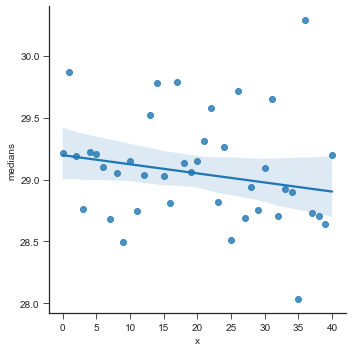

In [1779]:
## Using splash standards
# medians = fr.loc[fr['Identification'].str.contains('d-', na=False), all_run_order]

## Using top 100 features by max area 
medians = fr.loc[fr['Area (max)'].sort_values(ascending=False).index[:100], all_run_order]
medians = medians.median().to_frame('medians')
medians['x'] = range(len(medians))
# plt.plot(medians['x'], medians['medians'])
sns.lmplot(
    data=medians, x='x', y='medians', robust=True, n_boot=100
)

# Conclusion from basic filtering, PCA and boxplots:
1. Many Features have few Features Found from Final_Results output
    - Filtering these improves PCA slightly
2. PCA on identifications only shows tightest clustering of QCs without any normalization
1. QC8 closely aligns to QC_dil_50, and has median quant of log2(1) less than other QC files (i.e. it is half median quant)
    - this suggests it injected insufficient amount of sample, roughly half. 
2. The QC dilution series from 25 to 200 follows a diagonal across PCA plot, showing the axis of dilution 
    - Most of the plasma samples are on a line perpendicular to this diagonal dilution line
    - A few are outliers from this perpendicular line, which I expect to be fixed after median normalization 

In [1668]:
qc_rep_files = qc_rep_1700s.drop('1700s_QC8')
filt1 = fr.copy() # .drop('1700s_QC8', axis=1)

# Perform median normalization and repeat PCA plot

In [1669]:
quant_qc_files = filt1.filter(regex='RBG|QC\d').columns
med_of_med_diff = filt1[quant_qc_files].median() - filt1[quant_qc_files].median().median()
filt1.loc[:, quant_qc_files] = filt1.loc[:, quant_qc_files].sub(med_of_med_diff)
filt1

,Retention Time (min),Quant Ion,Polarity,Area (max),Identification,Lipid Class,Features Found,1700s_extract_blank_rep1,1700s_extract_blank_rep2,1700s_extract_blank_rep3,...,1743_33_RBG,1746_30_RBG,1746_31_RBG,1746_32_RBG,1748_29_RBG,1748_30_RBG,1748_31_RBG,1754_30_RBG,1754_31_RBG,1754_32_RBG
vl_5,0.701,329.02988,-,30.633115,NaN,NaN,31,14.226381,14.213035,16.011224,...,29.439735,28.332644,28.429783,28.904736,28.794685,28.210778,28.725861,28.930761,29.790617,29.015511
vl_6,0.703,287.05676,+,25.219560,NaN,NaN,51,13.891960,13.875591,13.951897,...,24.309358,23.992981,24.240367,24.496858,24.447664,23.833446,23.860861,24.561615,24.819140,24.342488
vl_11,0.706,247.09293,-,27.628314,NaN,NaN,53,14.076268,14.972670,14.172502,...,25.512199,24.959820,24.604704,25.162631,25.507772,24.462188,25.056897,25.395430,26.080585,25.063374
vl_12,0.706,645.10980,+,27.606511,NaN,NaN,36,13.684595,13.668225,13.744531,...,25.267956,25.127044,25.767346,25.224385,25.194166,24.314436,24.644500,25.546878,25.936505,25.079915
vl_14,0.708,623.13934,+,28.710186,NaN,NaN,16,13.764542,13.748172,13.824478,...,21.881378,21.767724,22.132044,22.225312,22.242538,21.680944,21.736814,22.374278,22.249579,21.893784
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vl_6486,20.822,1021.86597,+,23.836821,NaN,NaN,58,16.748494,16.705757,16.712849,...,19.151161,22.261418,22.568526,22.020557,22.120009,21.899178,22.988664,21.155786,18.500070,20.390548
vl_6487,20.833,943.81781,+,23.572909,NaN,NaN,35,21.889222,22.072254,19.384428,...,20.415505,20.944124,22.205953,20.774058,21.117261,21.072652,22.753736,20.887033,19.742084,20.583743
vl_6488,20.835,923.85229,+,24.011567,NaN,NaN,43,18.616348,18.442698,18.550770,...,18.828394,22.476158,22.277638,20.643374,21.639722,22.004580,22.753023,23.193032,19.600901,21.568044
vl_6489,20.838,565.56018,+,22.473276,NaN,NaN,32,16.793684,16.750947,16.758039,...,17.070847,19.033158,20.550072,18.984123,20.267537,21.353722,21.263688,21.718895,17.893844,18.264471


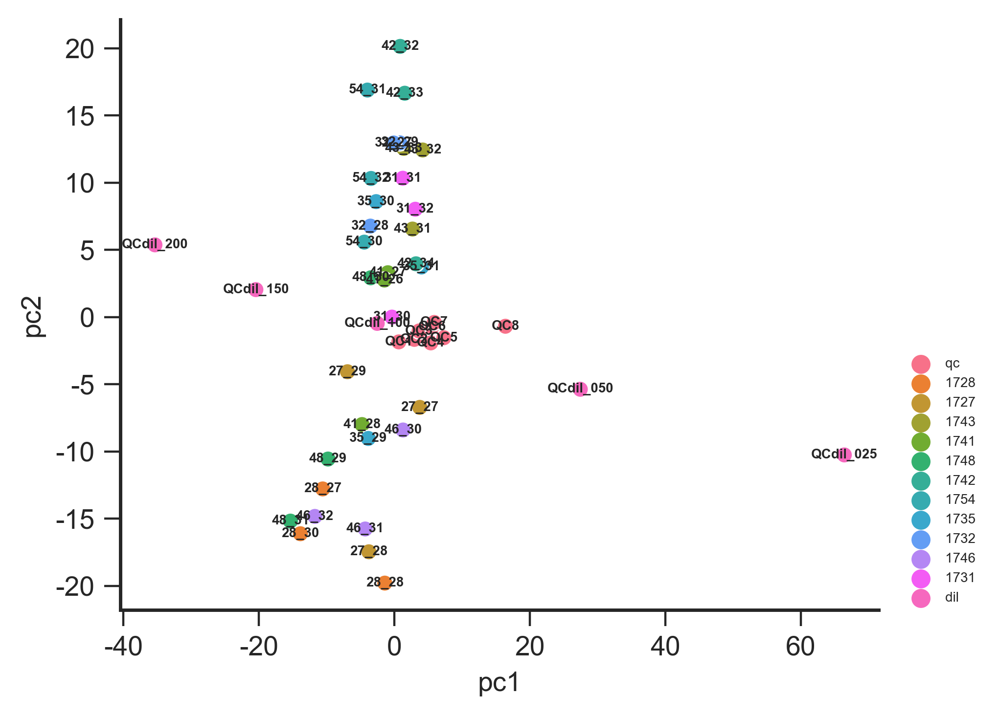

In [1670]:
files = fg.loc[(fg['cohort'] == '30wk') & \
               (fg['ogtt'].notna() 
                | fg['qc_rep'] 
                | fg['qc_dilution'] 
#                 | fg['blank_file']
               )
              ].index


df = filt1.loc[:, files].T
df = filt1.loc[fr['Identification'].notna(), files].T
df = pd.DataFrame(StandardScaler().fit_transform(df.values), index=df.index, columns=df.columns)
df
pca = pd.DataFrame(PCA().fit_transform(df), index=df.index, columns=[f'pc{x}' for x in range(1, len(df)+1)])
pca = pca.join(fg[['animal', 'lipid_run_order']])
pca = pca.sort_values('lipid_run_order')

pcx = 'pc1'
pcy = 'pc2'
fig, ax = plt.subplots(dpi=400, figsize=(5, 4))
sns.scatterplot(
    data=pca, x=pcx, y=pcy, hue='animal', ax=ax,
)

prevx, prevy = 0, 0
for i, row in pca.iterrows():
    
    if 'RBG' in i:
#         continue
        i = i[2:7]
#         ax.plot((prevx, row[pcx]), (prevy, row[pcy]), color='gray', zorder=-10)
#         prevx, prevy = row[pcx], row[pcy]
    if '1700s' in i:
        i = i[6:]
    ax.text(row[pcx], row[pcy], i, ha='center', va='center', fontsize=5, fontweight='bold')
    
ax.legend(loc=(1.03, 0), fontsize=5)
sns.despine()

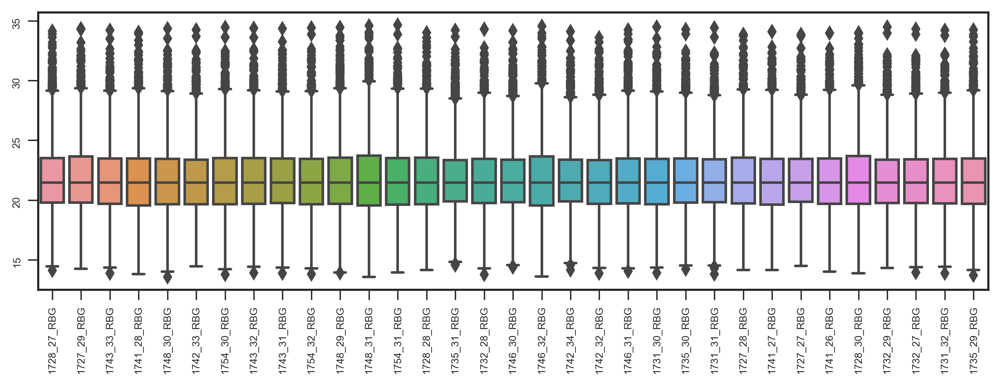

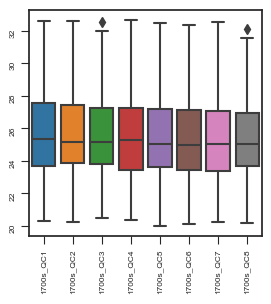

In [1671]:
run_order = fg.loc[(fg['cohort'] == '30wk') & (fg['has_ogtt']), 
                   'lipid_run_order'].sort_values().index

df = filt1.loc[:, run_order]

fig, ax = plt.subplots(dpi=300, figsize=(10, 3))
sns.boxplot(
    data=df, ax=ax,
)
ax.tick_params(rotation=90, labelsize=6)


# df = fr.loc[fr['Identification'].notna(), qc_rep_1700s]
df = filt1.loc[fr['Lipid Class'] == 'TG', qc_rep_1700s]

fig, ax = plt.subplots(dpi=100, figsize=(3, 3))

sns.boxplot(
    data=df, ax=ax, 
)
ax.tick_params(rotation=90, labelsize=6)

QC RSD 73.53 %
Dilution series Mean squared error 0.505


(73.52954571292804, 0.5053099467397347, False)

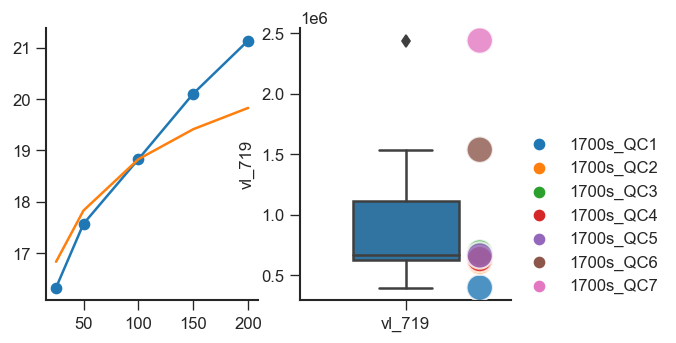

In [1672]:
# Check for monotonicity
def is_monotonic(L):
    return all(x<y for x, y in zip(L, L[1:]))

def get_qc_stats(row, plot=False, print_stats=False):
#     print(row)
    x = [25, 50, 100, 150, 200]
    
    qc_rep = 2**(row[qc_rep_files].T)
    qc_rep_rsd = (qc_rep.std() / qc_rep.mean()) * 100
    if isinstance(qc_rep_rsd, pd.Series):
        qc_rep_rsd = qc_rep_rsd.values[0]
    if print_stats:
        print('QC RSD', round(qc_rep_rsd, 2), '%')
    
    row = row[qc_dil_short]
    qc_dil_100 = row['1700s_QCdil_100']
    monotonic = is_monotonic(row)
    if isinstance(qc_dil_100, pd.Series):
        qc_dil_100 = qc_dil_100.values[0]
    theoretical_log2_quant = [qc_dil_100-2, qc_dil_100-1, qc_dil_100, qc_dil_100 + 0.585, qc_dil_100+1]
    mse = mean_squared_error(y_true=theoretical_log2_quant, y_pred=row.values.T)
    if print_stats:
        print('Dilution series Mean squared error', round(mse, 3))
#     msle = mean_squared_log_error(y_true=theoretical_log2_quant, y_pred=row.values.T)
#     print(msle)
    qc_rep_std = qc_rep.std()
#     print('QC 100uL rep standard deviation', qc_rep_std)


    if plot:
        fig, (ax1, ax2) = plt.subplots(ncols=2, dpi=120, figsize=(5, 3))
        ax1.plot(x, row.values.T, 'o-')
        ax1.plot(x, theoretical_log2_quant)
        sns.boxplot(data=qc_rep, orient='v', ax=ax2, width=0.5)
        sns.scatterplot(y=qc_rep.iloc[:, 0], 
                        x=0.35, ax=ax2, zorder=10, hue=qc_rep.index, s=250, alpha=0.8)
        ax2.legend(loc=(1.02, 0))
        sns.despine()
    return qc_rep_rsd, mse, monotonic
get_qc_stats(filt1.sample(1), plot=True, print_stats=True)

In [1673]:
filt1['qc_rsd'], filt1['qc_dil_mse'], filt1['is_monotonic'] = zip(*filt1.apply(lambda x: get_qc_stats(x), axis=1))
filt1['is_id'] = filt1['Identification'].notna()

QC RSD 30.54 %
Dilution series Mean squared error 0.482


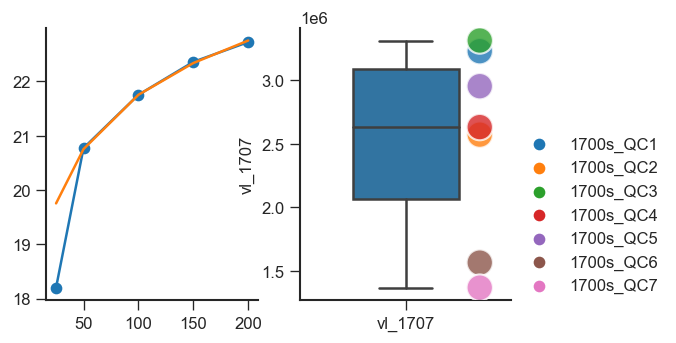

In [1674]:
_ = get_qc_stats(
    filt1.loc[(filt1['qc_dil_mse'] < 0.5) & (filt1['qc_dil_mse'] > 0.3)].sample(1), 
    plot=True, print_stats=True)

<AxesSubplot:xlabel='qc_rsd', ylabel='qc_dil_mse'>

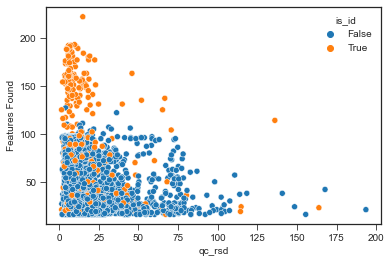

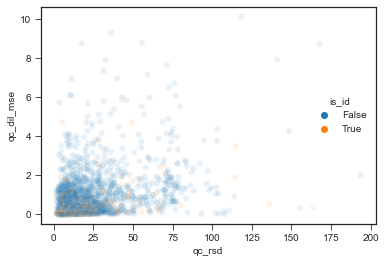

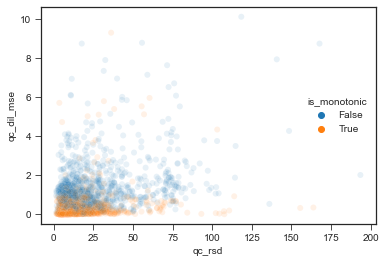

In [1675]:
sns.scatterplot(
    data=filt, x='qc_rsd', y='Features Found', hue='is_id',
)

plt.figure()
sns.scatterplot(
    data=filt, x='qc_rsd', y='qc_dil_mse', hue='is_id', alpha=0.1
)

plt.figure()
sns.scatterplot(
    data=filt, x='qc_rsd', y='qc_dil_mse', hue='is_monotonic', alpha=0.1
)

In [1676]:
filt2 = filt1.copy()
filt2 = filt2.loc[(filt2['qc_dil_mse'] < 0.3) & (filt2['qc_rsd'] < 15)]
display(filt2['Identification'].notna().sum())
display(filt2['Lipid Class'].value_counts())
filt2

259

TG              90
PC              59
SM              30
Plasmanyl-PC    22
Plasmenyl-PE    14
PI               8
Plasmenyl-PC     7
PE               7
LysoPC           5
Cer[NP]          3
Cer[NDS]         3
Plasmanyl-PE     2
LysoPE           1
HexCer[NS]       1
Cer[AP]          1
GlcCer[NDS]      1
Alkenyl-DG       1
Cer[NS]          1
PA               1
PS               1
CE               1
Name: Lipid Class, dtype: int64

,Retention Time (min),Quant Ion,Polarity,Area (max),Identification,Lipid Class,Features Found,1700s_extract_blank_rep1,1700s_extract_blank_rep2,1700s_extract_blank_rep3,...,1748_29_RBG,1748_30_RBG,1748_31_RBG,1754_30_RBG,1754_31_RBG,1754_32_RBG,qc_rsd,qc_dil_mse,is_monotonic,is_id
vl_6,0.703,287.05676,+,25.219560,NaN,NaN,51,13.891960,13.875591,13.951897,...,24.447664,23.833446,23.860861,24.561615,24.819140,24.342488,13.126279,0.202596,True,False
vl_11,0.706,247.09293,-,27.628314,NaN,NaN,53,14.076268,14.972670,14.172502,...,25.507772,24.462188,25.056897,25.395430,26.080585,25.063374,12.402181,0.070669,True,False
vl_16,0.709,426.99759,-,25.485461,NaN,NaN,19,13.754865,13.734585,13.909297,...,24.544015,24.395736,24.285635,24.550059,25.129216,24.762444,11.069221,0.188036,True,False
vl_19,0.715,293.09964,+,32.449205,NaN,NaN,79,14.587984,15.851096,17.730969,...,29.470405,29.541390,28.858724,29.724615,30.303536,29.635534,11.255436,0.025387,True,False
vl_60,0.762,514.28418,-,26.096843,NaN,NaN,22,17.274716,17.585457,17.806500,...,23.322535,22.259845,23.801439,23.230814,21.760463,22.551999,10.966872,0.221499,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vl_6458,20.537,986.92023,+,25.413108,TG 18:2_18:1_24:0,TG,78,17.113679,17.271889,17.956024,...,23.837037,23.189039,24.341628,23.049654,21.112887,22.252479,14.653994,0.016109,True,True
vl_6461,20.542,965.86005,+,25.980806,TG 58:2,TG,147,19.850663,19.817206,19.797762,...,24.265020,23.771806,24.981126,23.913712,22.333982,22.930080,10.214240,0.058626,True,True
vl_6481,20.802,897.83301,+,26.055316,NaN,NaN,75,16.737103,16.654132,16.701457,...,23.766087,24.817736,24.828439,25.010471,21.869211,22.639417,12.288005,0.004663,True,False
vl_6484,20.813,593.59186,+,24.672991,NaN,NaN,70,16.918875,16.876138,16.883230,...,22.505280,23.501130,23.491587,23.665170,20.632481,21.319745,9.932066,0.005341,True,False


QC RSD 8.56 %
Dilution series Mean squared error 0.084


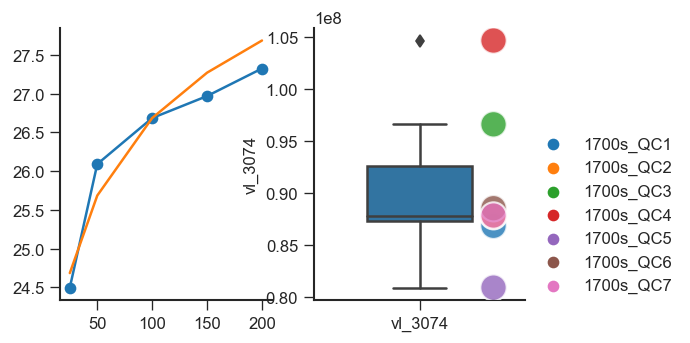

In [1690]:
_ = get_qc_stats(
    filt2.sample(1), 
    plot=True, print_stats=True)

# Plot repeatability of standards in the Splash mixture

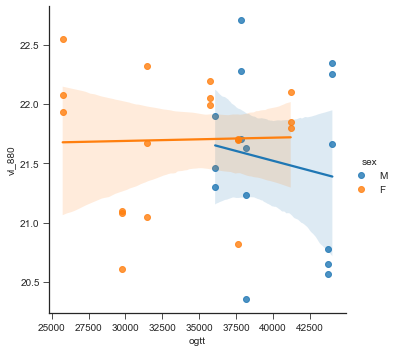

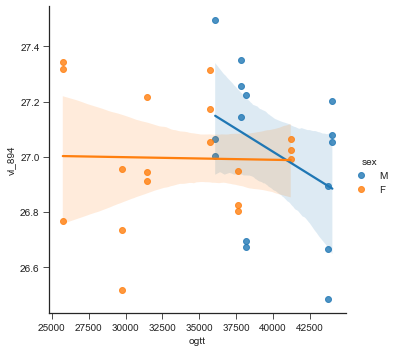

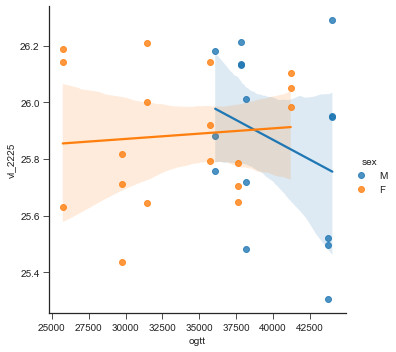

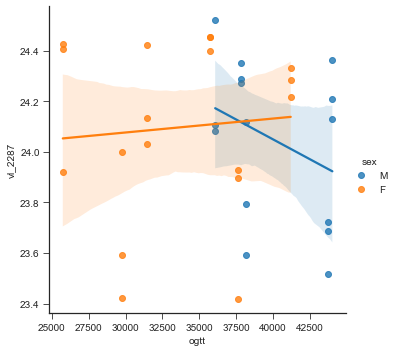

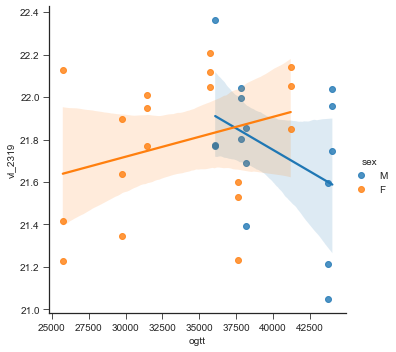

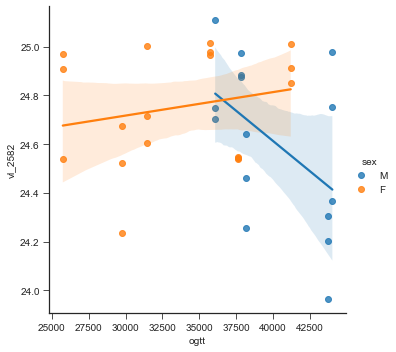

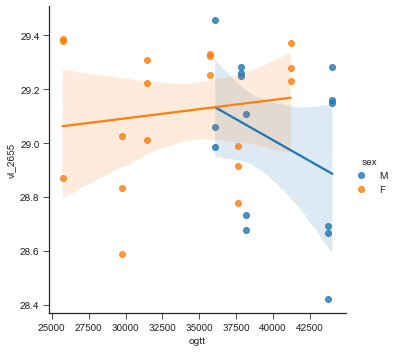

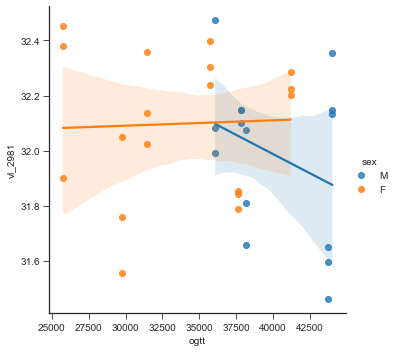

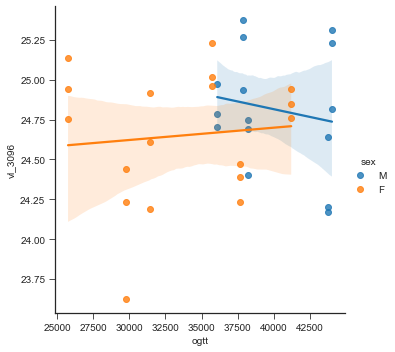

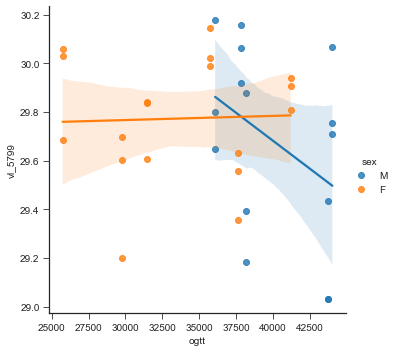

In [1704]:
splash_standards = filt2.loc[filt2['ID'].str.contains('d-')].index
for feat in splash_standards:
    df = (filt2
          .loc[feat, quant_files_1700s]
          .astype('float')
          .to_frame()
          .join(fg[['ogtt', 'sex', 'num_wk_before_ogtt']])
         )
    # display(df)
    sns.lmplot(
        data=df, x='ogtt', y=feat, hue='sex', # col='num_wk_before_ogtt',
    )

26.061291695046346


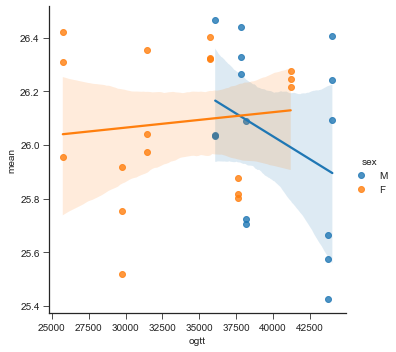

In [1720]:
df = (filt2
      .loc[splash_standards, quant_files_1700s]
      .mean()
      .to_frame('mean')
      .join(fg[['ogtt', 'sex', 'num_wk_before_ogtt']])
     )
grand_mean = df['mean'].mean()
print(grand_mean)
splash_offset = df['mean'] - grand_mean
sns.lmplot(
    data=df, x='ogtt', y='mean', hue='sex', # col='num_wk_before_ogtt',
)

In [1724]:
filt3.loc[:, quant_files_1700s] - splash_offset

,1727_27_RBG,1727_28_RBG,1727_29_RBG,1728_27_RBG,1728_28_RBG,1728_30_RBG,1731_30_RBG,1731_31_RBG,1731_32_RBG,1732_27_RBG,...,1743_33_RBG,1746_30_RBG,1746_31_RBG,1746_32_RBG,1748_29_RBG,1748_30_RBG,1748_31_RBG,1754_30_RBG,1754_31_RBG,1754_32_RBG
vl_6,22.955862,23.104255,24.099229,22.558081,21.634801,22.743560,24.439750,24.949476,25.060168,25.524067,...,24.834881,23.381345,23.155311,24.206973,24.077775,23.348513,23.346112,24.385714,25.405601,24.300067
vl_11,23.728809,24.171784,25.316047,24.010701,22.254307,23.705570,25.711585,25.476582,25.940682,26.546727,...,26.037722,24.348184,23.519648,24.872746,25.137882,23.977255,24.542148,25.219529,26.667046,25.020953
vl_16,23.159471,23.387910,24.270432,23.694953,22.758965,22.785716,24.650973,24.633446,24.614597,24.987992,...,25.368224,23.615379,23.365168,24.623070,24.174125,23.910803,23.770886,24.374158,25.715678,24.720023
vl_19,27.644286,28.479648,29.305350,28.305910,27.511803,27.732566,29.588359,29.713610,29.794517,30.589131,...,30.487597,28.541352,28.468611,29.289687,29.100516,29.056457,28.343975,29.548714,30.889998,29.593113
vl_60,22.741719,22.443629,24.813386,22.044406,22.804804,24.029689,23.100917,22.463064,22.194464,25.483004,...,23.060728,22.712797,20.615547,22.140173,22.952646,21.774912,23.286690,23.054913,22.346924,22.509578
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vl_6458,22.844179,23.742746,23.490146,23.150300,23.564575,23.327264,23.449719,22.623918,22.113825,22.322988,...,22.309157,22.748161,22.587328,23.471311,23.467147,22.704106,23.826879,22.873753,21.699348,22.210058
vl_6461,23.740717,24.847889,24.209506,23.777322,24.132273,24.044545,24.339366,23.185274,23.428280,23.390492,...,22.867482,23.527526,23.324727,24.252739,23.895131,23.286874,24.466377,23.737811,22.920443,22.887659
vl_6481,24.204519,24.954333,25.307612,22.757569,23.840356,23.519071,24.183881,23.877226,23.607130,23.324853,...,21.943114,22.906810,23.088311,23.290051,23.396198,24.332803,24.313690,24.834570,22.455673,22.596997
vl_6484,22.837157,23.572008,24.007694,21.554780,22.539676,22.140157,22.924240,22.585015,21.844861,22.027259,...,20.997996,21.526252,21.708011,21.956822,22.135391,23.016198,22.976838,23.489269,21.218943,21.277324


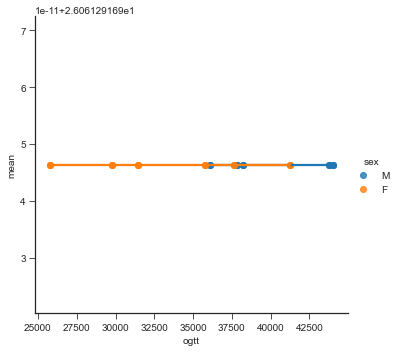

In [1725]:
filt3 = filt2.copy()
filt3.loc[:, quant_files_1700s] = filt3.loc[:, quant_files_1700s] - splash_offset

df = (filt3
      .loc[splash_standards, quant_files_1700s]
      .mean()
      .to_frame('mean')
      .join(fg[['ogtt', 'sex', 'num_wk_before_ogtt']])
     )

sns.lmplot(
    data=df, x='ogtt', y='mean', hue='sex', # col='num_wk_before_ogtt',
)

# Clean up the filtered data and write to csv

In [1678]:
filt2.rename({'Quant Ion': 'm/z', 'Retention Time (min)': 'RT', 'Identification': 'ID',
              'Polarity': 'polarity', 'Lipid Class': 'molec_class'},
    axis=1, inplace=True)
filt2.drop('Area (max)', axis=1, inplace=True)
filt2['ID'] = filt2['ID'].replace(np.nan, 'Unidentified')
filt2['molec_class'] = filt2['molec_class'].replace(np.nan, 'Unidentified')

heavy_labeled = filt2.loc[filt2['ID'].str.contains('d-7')].index
filt2.loc[heavy_labeled, 'is_id'] = False
filt2['superclass'] = filt2['molec_class'].map(compound_superclasses)
filt2
filt2.to_csv('../data/processed/1700s_validation_lipids.csv')

## Check OGTT curves for validation animals

animal,1727,1728,1731,1732,1735,1741,1746,1748,1742,1743,1754
0,105.0,120.5,67.0,96.5,73.0,63.5,81.0,66.5,77.0,75.5,72.0
10,135.0,221.0,143.5,147.0,137.5,244.5,135.0,210.5,113.0,152.5,166.0
20,218.0,306.5,316.0,236.5,301.5,345.0,194.5,219.0,159.5,203.5,199.5
30,298.5,394.5,296.5,269.0,357.0,357.5,246.0,465.0,235.0,298.0,288.5
60,433.5,452.0,376.3,399.5,371.0,484.5,296.0,387.5,289.5,449.0,327.0
120,289.0,322.0,447.5,339.5,250.0,296.0,261.5,209.5,163.5,188.5,232.0


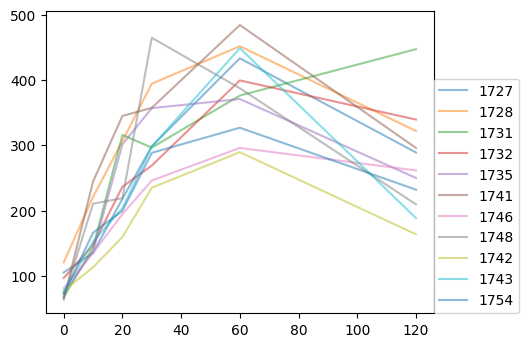

In [1504]:
fig, ax = plt.subplots(dpi=100, figsize=(5,4))
ogtts = ap.loc[ap['cohort'] == '30wk'].filter(regex='OGTT\(').dropna().T#.plot(kind='line', ax=ax)
ogtts.index = [0, 10, 20, 30, 60, 120]
display(ogtts)
ogtts.plot(kind='line', ax=ax, alpha=0.5)
plt.legend(loc=(1, 0))


# ogtts['time'] = ogtts.index
# ogtts = ogtts.melt(id_vars='time').merge(ap['sex'], left_on='animal', right_index=True)
# plt.figure()
# sns.lineplot(
#     data=ogtts, x='time', y='value', hue='sex', markers='animal',  
# )
# plt.legend(loc=(1.01, 0))

## Mixed effects modeling

In [229]:
d_features = []
models = {}
for feature in filt.filter(regex='vl_').columns:
#     print(feature)
    id_ = fr.loc[feature, 'Identification']
    if 'd-' in id_:
        d_features.append((feature, id_))
        continue
    model = smf.mixedlm(
        f'{feature} ~ sex + ogtt + sex:ogtt', data=filt, groups='animal', #re_formula='~sex',
    )
    model = model.fit(maxiter=10)
    models[feature] = model

vl_460
vl_463
vl_629
vl_637
vl_710
vl_718
vl_719
vl_723
vl_724
vl_731
vl_762
vl_772
vl_809
vl_818
vl_823
vl_831
vl_833
vl_847
vl_848
vl_857
vl_880
vl_888
vl_894
vl_899
vl_902
vl_934
vl_946
vl_948
vl_1020
vl_1056
vl_1123
vl_1829
vl_1863
vl_1902
vl_2027
vl_2079
vl_2083


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\statsmodels\regression\mixed_linear_model.py:2202: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  ConvergenceWarning)


vl_2091
vl_2110
vl_2114
vl_2119
vl_2146
vl_2148
vl_2167
vl_2174
vl_2178
vl_2181
vl_2186
vl_2191
vl_2193
vl_2194
vl_2225
vl_2240
vl_2283
vl_2287
vl_2319
vl_2321
vl_2327
vl_2330
vl_2340
vl_2342
vl_2357
vl_2375
vl_2379
vl_2384
vl_2388
vl_2392
vl_2438
vl_2456
vl_2463
vl_2476
vl_2483
vl_2500
vl_2535
vl_2552
vl_2566
vl_2568
vl_2580
vl_2582
vl_2590
vl_2593
vl_2594
vl_2597
vl_2603
vl_2617
vl_2639
vl_2641
vl_2642
vl_2645
vl_2651
vl_2655
vl_2667
vl_2671
vl_2687
vl_2723
vl_2735
vl_2744
vl_2761
vl_2765
vl_2775
vl_2813
vl_2834
vl_2851
vl_2860
vl_2876
vl_2888
vl_2893
vl_2902
vl_2906
vl_2911
vl_2912
vl_2950
vl_2955
vl_2959
vl_2979
vl_2981
vl_2998
vl_3007
vl_3013
vl_3017
vl_3035
vl_3046
vl_3050
vl_3055
vl_3073
vl_3075
vl_3085
vl_3096
vl_3103
vl_3104
vl_3153
vl_3154
vl_3167
vl_3175
vl_3178
vl_3196
vl_3213
vl_3220
vl_3251
vl_3252
vl_3258
vl_3287
vl_3306
vl_3330
vl_3379
vl_3388
vl_3432
vl_3443
vl_3446
vl_3461
vl_3484
vl_3504
vl_3507
vl_3508
vl_3513
vl_3517
vl_3536
vl_3545
vl_3549
vl_3564
vl_3568
vl_3572


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


vl_5101
vl_5103
vl_5104
vl_5124
vl_5141
vl_5156


C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\statsmodels\regression\mixed_linear_model.py:2202: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  ConvergenceWarning)
C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\statsmodels\regression\mixed_linear_model.py:2202: ConvergenceWarning: Retrying MixedLM optimization with cg
  ConvergenceWarning)
C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\statsmodels\base\model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\Users\bjanderson23\AppData\Roaming\Python\Python37\site-packages\statsmodels\regression\mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a 

vl_5174
vl_5182
vl_5184
vl_5201
vl_5224
vl_5226
vl_5240
vl_5244
vl_5248
vl_5251
vl_5265
vl_5266
vl_5282
vl_5291
vl_5337
vl_5342
vl_5346
vl_5351
vl_5353
vl_5356
vl_5360
vl_5365
vl_5366
vl_5370
vl_5379
vl_5381
vl_5383
vl_5405
vl_5414
vl_5434
vl_5437
vl_5443
vl_5448
vl_5482
vl_5485
vl_5503
vl_5505
vl_5511
vl_5521
vl_5535
vl_5545
vl_5559
vl_5567
vl_5572
vl_5583
vl_5587
vl_5589
vl_5596
vl_5603
vl_5608
vl_5616
vl_5620
vl_5621
vl_5637
vl_5642
vl_5644
vl_5645
vl_5691
vl_5694
vl_5718
vl_5719
vl_5720
vl_5722
vl_5727
vl_5728
vl_5736
vl_5741
vl_5748
vl_5799
vl_5804
vl_5809
vl_5814
vl_5822
vl_5830
vl_5837
vl_5838
vl_5845
vl_5855
vl_5856
vl_5883
vl_5892
vl_5897
vl_5926
vl_5932
vl_5935
vl_5944
vl_5958
vl_5986
vl_6010
vl_6022
vl_6034
vl_6043
vl_6053
vl_6057
vl_6065
vl_6068
vl_6119
vl_6141
vl_6180
vl_6183
vl_6191
vl_6200
vl_6202
vl_6251
vl_6270
vl_6274
vl_6282
vl_6290
vl_6303
vl_6326
vl_6379
vl_6384
vl_6391
vl_6395
vl_6396
vl_6402
vl_6424
vl_6431
vl_6436
vl_6454
vl_6458
vl_6459
vl_6461


Text(0.5, 1.0, 'vl_4879\nTG 22:6_22:6_22:6\n14.281')

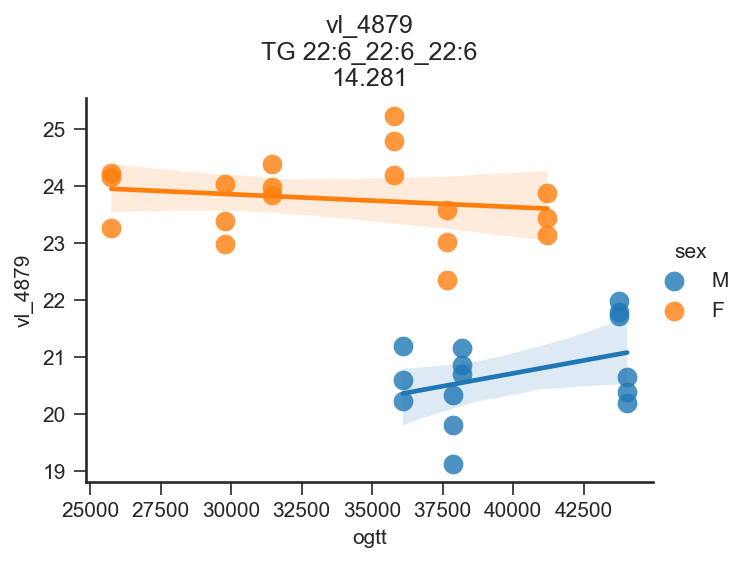

In [1727]:
df = filt2.filter(regex='RBG').T.join(fg[['ogtt', 'sex']])
# feature = filt2.loc[filt2['is_id']].sample(1).index[0]  # random feature
feature = 'vl_4879'  # TG 22:6_22:6_22:6
# fig, ax = plt.subplots(dpi=150, figsize=(5, 3))
sns.lmplot(
    data=df, 
#     y='vl_6435',
    y=feature,
    x='ogtt',
    hue='sex', 
    scatter_kws=dict(lw=0, s=90)
)
fig, ax = plt.gcf(), plt.gca()
fig.set_size_inches(5, 3)
fig.set_dpi(150)
ax.set_title(f'{feature}\n{filt2.loc[feature, "ID"]}\n{filt2.loc[feature, "RT"]}')

C:\Users\bjanderson23\anaconda3\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


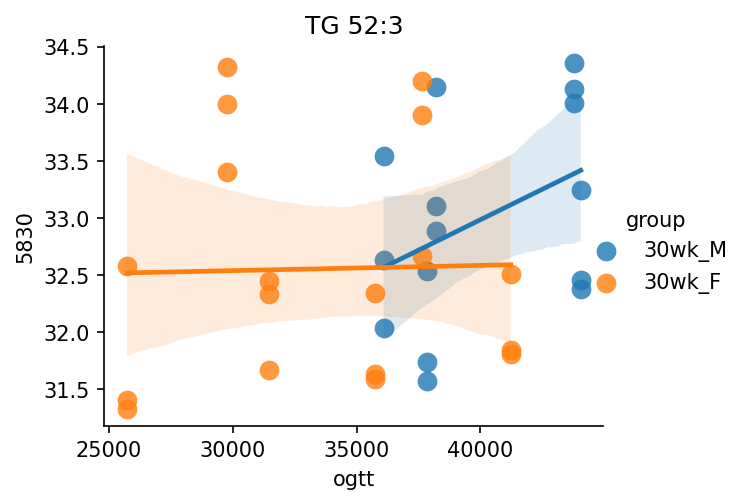

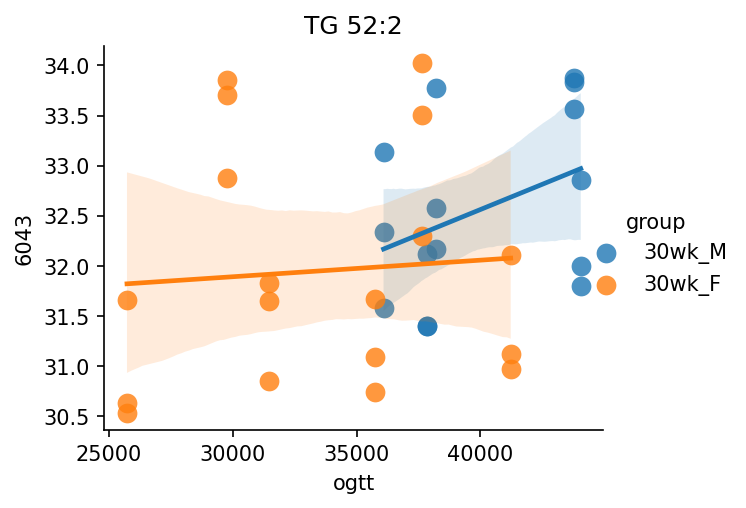

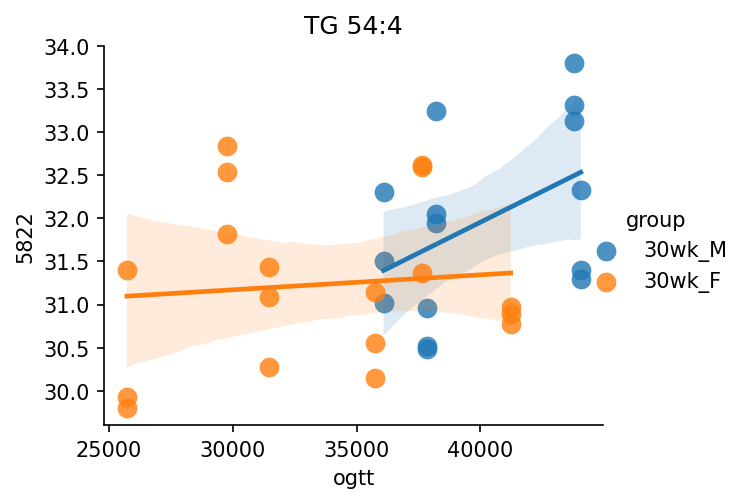

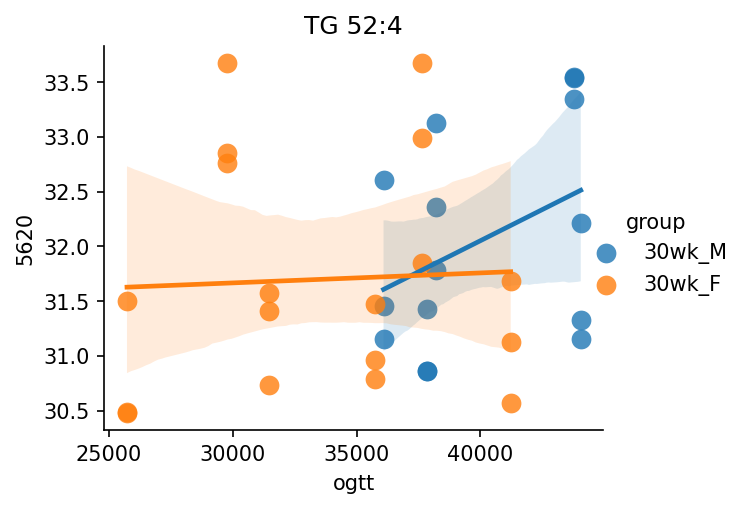

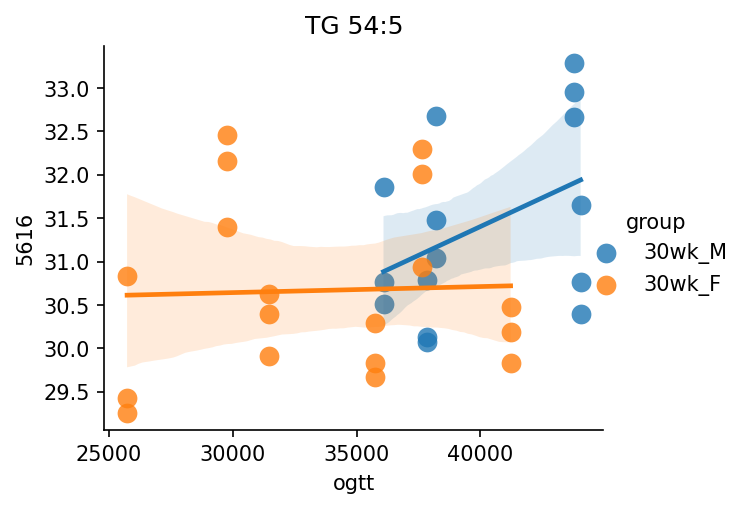

...

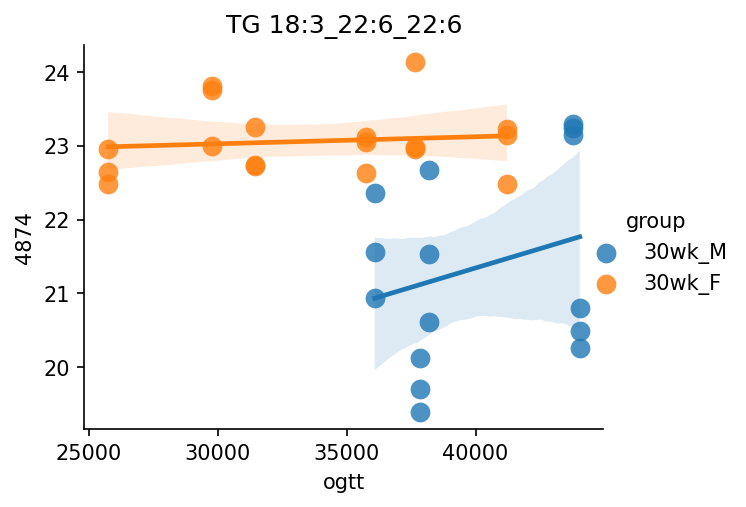

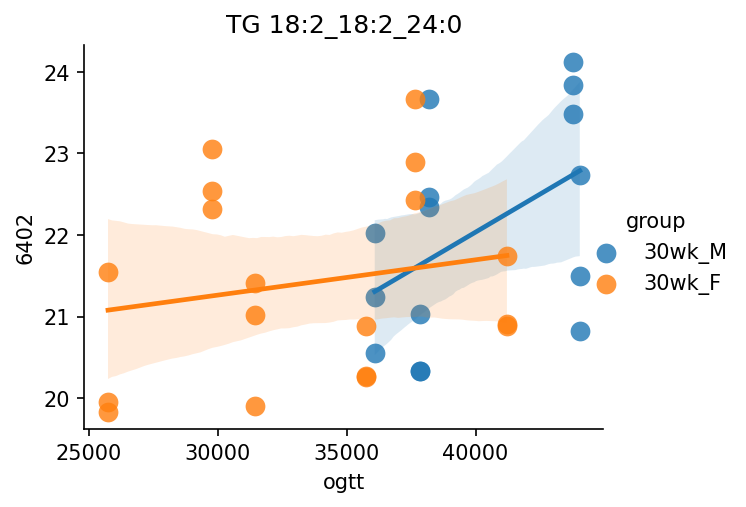

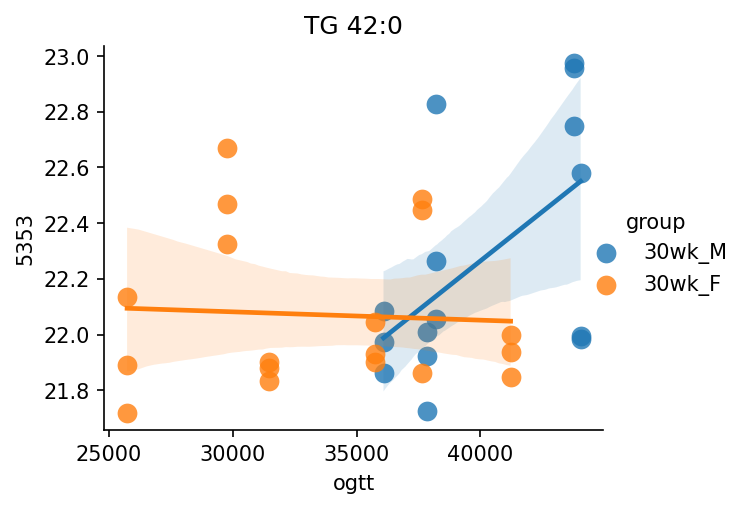

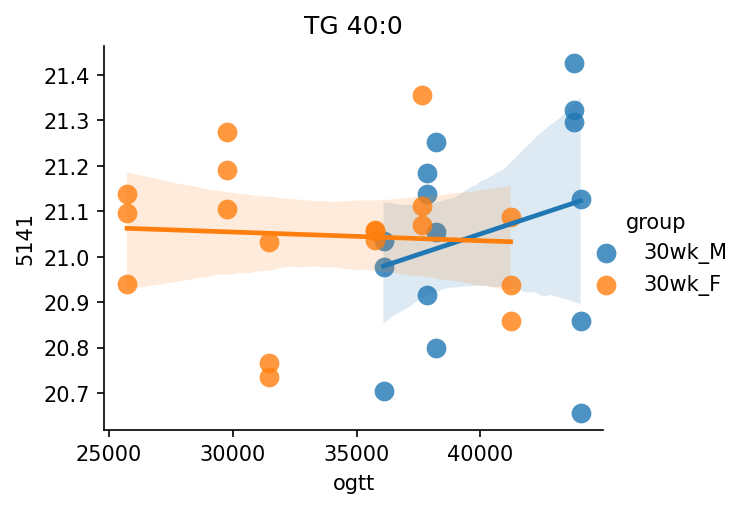

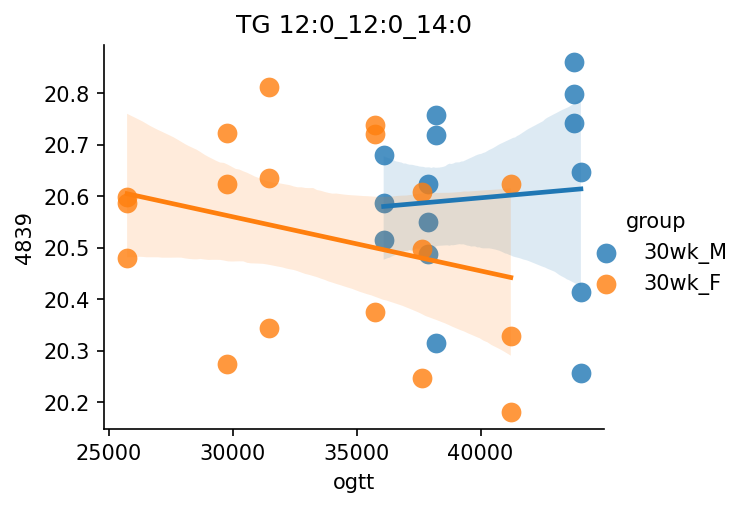

In [73]:
# animal_subset = ap.loc[(ap['validation'])].index
# df = fr.loc[:, fg.loc[(fg['animal'].isin(animal_subset)) & (fg['validation'])].index]
# # df = df.join(fr['Identification'])

# top_feat_ids = [
#     'CE 18:1', 
#     'Plasmanyl-PC O-20:0_20:4', 
#     'FA 18:0',
#     'PC 36:3', 'PC 38:7', 
#     '4-Guanidinobutyric acid', 
#     'SM d37:1',
#     'TG 20:5_22:6_22:6', 'TG 22:6_22:6_22:6', 'TG 18:1_22:6_22:6',
# ]
# # df = df.loc[fr['Identification'].isin(top_feat_ids)]
# df = df.T
# df = df.join(fg[['ogtt', 'sex', 'animal', 'cohort']])
# df['ogtt']
# df.columns = df.columns.astype('str')
# df['group'] = df['cohort'] + '_' + df['sex']
# # df = df.drop(fg.loc[~fg['sufficient_sample']].index)
# display(df.columns)
# df = df.loc[(df['group'].isin([
# #     '10wk_M', 
#     '30wk_M', 
#     '30wk_F'
# ]))]

for tg in filt.index: 
    feature = str(tg)
    # fig, ax = plt.subplots(dpi=300, figsize=(4, 3))
    sns.lmplot(
        data=df, y=feature, x='ogtt',
        hue='group', 
        scatter_kws=dict(lw=0, s=90)
    )
    fig = plt.gcf()
    fig.set_dpi(150)
    fig.set_size_inches(5, 3)
    fig.set_facecolor('white')
    plt.title(fr.loc[int(feature), 'Identification'])
    plt.savefig(f'../reports/figures/All Quant vs OGTT plots/validation ogtt/{feature}.png', 
                dpi=120, facecolor='white', bbox_inches='tight')
    # fig.legend(loc=(1, 0))
    # for animal in animal_subset:
    #     if apval.loc[animal, 'sex'] == 'F':
    #         plt.axvline(apval.loc[animal, 'OGTT(AUC)'], color='0.1', lw=0.5)

## Get a linear regression for 30wk M and 30wk F for each ID'd validation feature
## Compare slopes on scatterplot

In [1591]:
df = filt2.loc[:, quant_files_1700s].T
df = df.join(fg[['ogtt', 'sex', 'animal']])
ols_models = []

for feature in df.filter(regex='vl_').columns:
    result = {'Feature': feature}
    for sex in ['F', 'M']:
        model = smf.ols(f'{feature} ~ ogtt', data=df.loc[df['sex'] == sex]).fit()
        result[sex+'_ogtt_slope'] = model.params['ogtt']
        result[sex+'_ogtt_slope_pval'] = model.pvalues['ogtt']
        result[sex+'_ogtt_slope_conf_int'] = model.conf_int().loc['ogtt'].to_list()
        result[sex+'_R2'] = model.rsquared
    ols_models.append(result)

In [1624]:
rdf = pd.DataFrame(ols_models)
rdf.index = rdf['Feature']
rdf = rdf.join(filt2[['ID', 'molec_class', 'superclass', 'is_id']])
# rdf = rdf.loc[rdf['Lipid Class'].isin(colors.keys())]
rdf

,Feature,F_ogtt_slope,F_ogtt_slope_pval,F_ogtt_slope_conf_int,F_R2,M_ogtt_slope,M_ogtt_slope_pval,M_ogtt_slope_conf_int,M_R2,ID,molec_class,superclass,is_id
Feature,,,,,,,,,,,,,
vl_6,vl_6,-0.000014,0.364680,"[-4.4280594288483804e-05, 1.7215098974357556e-05]",0.051600,-8.883920e-05,0.082596,"[-0.0001908871689948126, 1.3208778079822767e-05]",0.213892,Unidentified,Unidentified,Unidentified,False
vl_11,vl_11,-0.000006,0.774114,"[-4.743933999860385e-05, 3.595620903884859e-05]",0.005297,-6.864083e-05,0.256955,"[-0.00019370389101957, 5.642222783117695e-05]",0.097594,Unidentified,Unidentified,Unidentified,False
vl_16,vl_16,-0.000034,0.039637,"[-6.598957147263604e-05, -1.8182048301614197e-06]",0.238739,-2.169757e-07,0.995422,"[-8.035738392052801e-05, 7.992343252875894e-05]",0.000003,Unidentified,Unidentified,Unidentified,False
vl_19,vl_19,-0.000035,0.051656,"[-6.960477856202303e-05, 2.806849891093496e-07]",0.216535,-4.500809e-05,0.365988,"[-0.0001488127366825499, 5.8796561816506116e-05]",0.063226,Unidentified,Unidentified,Unidentified,False
vl_60,vl_60,0.000064,0.071644,"[-6.37732403361355e-06, 0.00013536266689492067]",0.188706,-1.156767e-04,0.140462,"[-0.00027486677722324867, 4.351336328625046e-05]",0.159361,Unidentified,Unidentified,Unidentified,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
vl_6458,vl_6458,0.000044,0.377707,"[-5.864295341790643e-05, 0.00014640025003775724]",0.048933,1.430370e-04,0.063584,"[-9.348663986990965e-06, 0.0002954226566333827]",0.240304,TG 18:2_18:1_24:0,TG,Glycerolipid,True
vl_6461,vl_6461,0.000025,0.549754,"[-6.211347581489568e-05, 0.00011242171780158721]",0.022804,1.423381e-04,0.051889,"[-1.3507876704959177e-06, 0.00028602697445582114]",0.260517,TG 58:2,TG,Glycerolipid,True
vl_6481,vl_6481,0.000054,0.315065,"[-5.6661157969213047e-05, 0.00016522038381099782]",0.063000,1.333502e-05,0.857886,"[-0.00014438616579130078, 0.00017105620042993965]",0.002560,Unidentified,Unidentified,Unidentified,False


In [1514]:
importlib.reload(src.plots)
from src.plots import set_square_ratio

findfont: Font family ['sans-serif'] not found. Falling back to Helvetica.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, DejaVu Sans, Bitstream Vera Sans, sans-serif
findfont: Font family ['sans-serif'] not found. Falling back to Helvetica.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, DejaVu Sans, Bitstream Vera Sans, sans-serif
findfont: Font family ['sans-serif'] not found. Falling back to Helvetica.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, DejaVu Sans, Bitstream Vera Sans, sans-serif


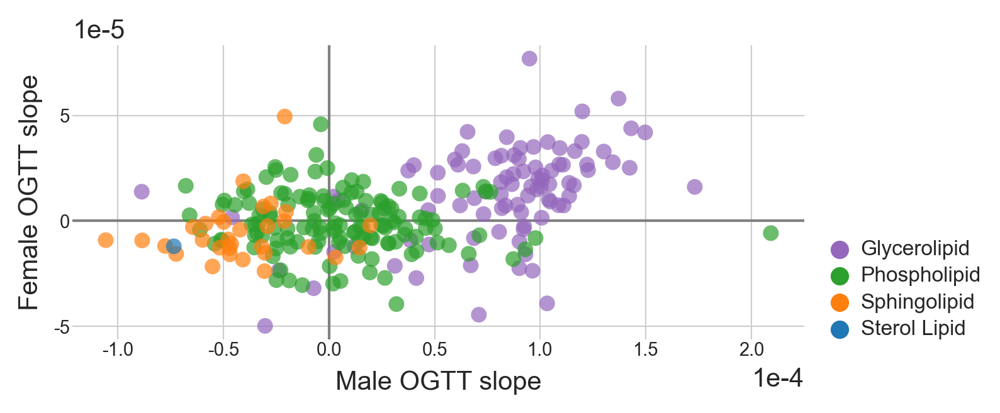

In [1663]:
fig, ax = plt.subplots(dpi=300, figsize=(5, 5))

df = rdf.loc[rdf['ID'] != 'Unidentified']
df = df.sort_values('superclass')
sns.scatterplot(
    data=df, 
    y='F_ogtt_slope', x='M_ogtt_slope', hue='superclass', palette=colors,
    edgecolor='none', alpha=0.7, zorder=10,
)

## Label outliers 
# for i, row in df.iterrows():
#     if row['F_ogtt_slope'] > 0.00005 or row['F_ogtt_slope'] < -0.000038 or \
#         row['M_ogtt_slope'] > 0.00015 or row['M_ogtt_slope'] < -0.00008:
#         ax.text(row['M_ogtt_slope'], row['F_ogtt_slope'], row['ID'], 
#                 fontsize=5, ha='center', va='center')
        
ax.set_xlabel('Male OGTT slope')
ax.set_ylabel('Female OGTT slope')
ax.set_xticks([-10e-5, -5e-5, 0, 5e-5, 10e-5, 15e-5, 20e-5])
ax.set_yticks([-5e-5, 0, 5e-5])

ax.axvline(0, color='gray', lw=1, zorder=5)
ax.axhline(0, color='gray', lw=1, zorder=5)
ax.legend(loc=(1.01, 0))
ax.ticklabel_format(style='sci', scilimits=(0, 0), axis='both')
ax.tick_params(length=0, pad=1, labelsize=7)

ax.grid(lw=0.5)
ax.set_axisbelow(True)
ax.set_aspect('equal')
# set_square_ratio(ax)

ax.legend(loc=(1.02, 0), borderpad=0, labelspacing=0.34, frameon=False, handletextpad=0, fontsize=8)

sns.despine(bottom=True, left=True, ax=ax)

# plt.savefig('../reports/figures/Figure6/valdiation_ogtt_slope_vs_slope.pdf', bbox_inches='tight')

In [1625]:
rdf['M+F_R2'] = rdf['M_R2'] + rdf['F_R2']
rdf.sort_values('M+F_R2', ascending=False)[['M_R2', 'F_R2', 'ID', 'molec_class', 'superclass']].iloc[50:100]

,M_R2,F_R2,ID,molec_class,superclass
Feature,,,,,
vl_4133,0.291851,0.174406,SM d42:2,SM,Sphingolipid
vl_3523,0.257506,0.208154,Unidentified,Unidentified,Unidentified
vl_5888,0.461926,0.000016,Unidentified,Unidentified,Unidentified
vl_4340,0.332768,0.128086,Unidentified,Unidentified,Unidentified
vl_5699,0.304997,0.152991,Unidentified,Unidentified,Unidentified
vl_2878,0.438566,0.019190,Unidentified,Unidentified,Unidentified
vl_6164,0.201728,0.254125,Unidentified,Unidentified,Unidentified
vl_3972,0.451679,0.004086,Unidentified,Unidentified,Unidentified
vl_4005,0.386209,0.068018,Unidentified,Unidentified,Unidentified


In [1742]:
(rdf
 .sort_values('M_R2', ascending=False)
 .loc[rdf['is_id'], ['M_R2', 'F_R2', 'ID', 'molec_class', 'superclass']]
 .iloc[:50]
)

,M_R2,F_R2,ID,molec_class,superclass
Feature,,,,,
vl_4656,0.608790,0.003703,HexCer[NS] d42:1,HexCer[NS],Phospholipid
vl_4657,0.599524,0.001432,GlcCer[NDS] d42:1,GlcCer[NDS],Phospholipid
vl_4004,0.571311,0.034774,SM d41:2,SM,Sphingolipid
vl_2375,0.475723,0.032057,PC 18:2_20:4,PC,Phospholipid
vl_4609,0.475109,0.100519,Cer[NP] t18:0_23:0,Cer[NP],Phospholipid
vl_2876,0.470899,0.014742,SM d34:0,SM,Sphingolipid
vl_3823,0.462429,0.094656,SM d40:2,SM,Sphingolipid
vl_4768,0.421942,0.077217,Cer[NP] t18:0_24:0,Cer[NP],Phospholipid
vl_3013,0.391499,0.021269,Cer[NP] t18:0_16:0,Cer[NP],Phospholipid


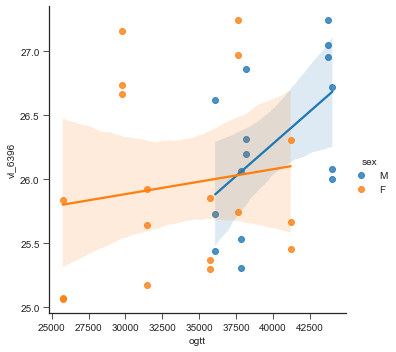

<Figure size 432x288 with 0 Axes>

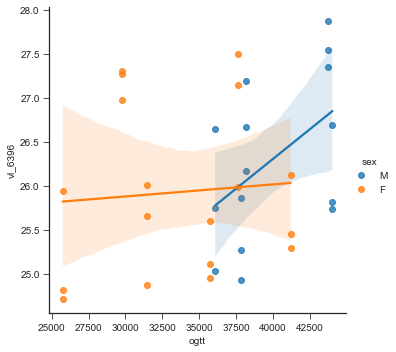

In [1744]:
feat = 'vl_6396'
df = (filt2
      .loc[feat, quant_files_1700s]
      .astype('float')
      .to_frame()
      .join(fg[['ogtt', 'sex', 'num_wk_before_ogtt']])
     )
# display(df)
sns.lmplot(
    data=df, x='ogtt', y=feat, hue='sex', # col='num_wk_before_ogtt',
)
plt.figure()

df = (filt3
      .loc[feat, quant_files_1700s]
      .astype('float')
      .to_frame()
      .join(fg[['ogtt', 'sex', 'num_wk_before_ogtt']])
     )
# display(df)
sns.lmplot(
    data=df, x='ogtt', y=feat, hue='sex', # col='num_wk_before_ogtt',
)

QC RSD 7.02 %
Dilution series Mean squared error 0.083


IndexingError: Too many indexers

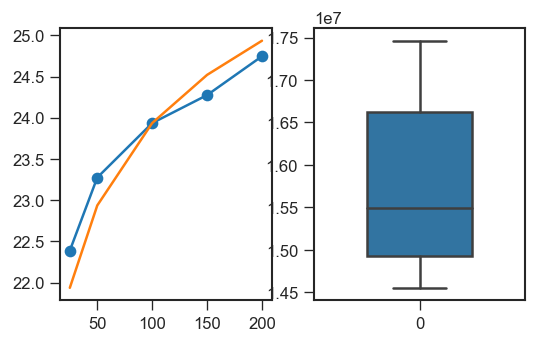

In [1786]:
_ = get_qc_stats(
    fr.loc['vl_4768'], 
    plot=True, print_stats=True)

Retention Time (min)                         13.438
Quant Ion                                 652.62579
Polarity                                          -
Area (max)                                 25.33947
Identification                   Cer[NP] t18:0_23:0
Lipid Class                                 Cer[NP]
Features Found                                   68
1700s_extract_blank_rep1                  20.670333
1700s_extract_blank_rep2                  21.061974
1700s_extract_blank_rep3                  21.109813
1700s_QCdil_025                            21.84024
1700s_QCdil_050                           22.968539
1700s_QCdil_100                           23.750149
1700s_QC1                                  23.69269
1700s_QC2                                 23.719436
1700s_QC3                                 23.725608
1700s_QC4                                 23.756106
1700s_QC5                                 23.803742
1700s_QC6                                 23.767887
1700s_QC7   

Text(0.5, 1.0, 'GlcCer[NDS] d42:1')

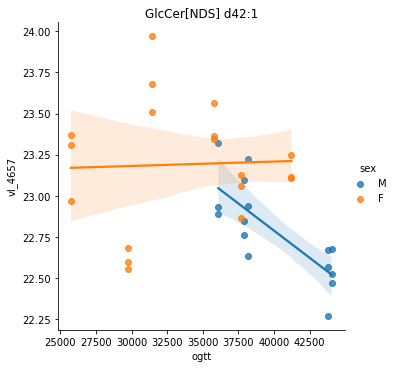

In [1659]:
feat = 'vl_4657'
df = filt2.loc[feat, quant_files_1700s].astype('float').to_frame().join(fg[['ogtt', 'sex']])
# display(df)
sns.lmplot(
    data=df, x='ogtt', y=feat, hue='sex',
)
plt.title(filt2.loc[feat, 'ID'])

### Get lipid run order

In [824]:
fg.loc[fg['validation']].merge(order, left_on='File Name_lipid', right_index=True)['lipid_run_order_y'].to_clipboard()

In [817]:
order = {}
for file in Path('../data/raw/lipidomics/').glob('*.raw'):
    if 'BJA-Nilerat' not in str(file):
        continue
    mtime = file.stat().st_mtime  # modified time (ctime = creation time doesn't order correctly)
    order[str(file.stem)] = mtime
order = pd.Series(order, name='lipid_run_order').rank().sort_values()
order

BJA-Nilerat-20220915_lipid_1700s_water_blank_rep1            1.0
BJA-Nilerat-20220915_lipid_1700s_extract_blank_rep1          2.0
BJA-Nilerat-20220915_lipid_1700s_resuspension_blank_rep1     3.0
BJA-Nilerat-20220915_lipid_1700s_QC100uL_rep1                4.0
BJA-Nilerat-20220915_lipid_1728M_27wk_0606                   5.0
                                                            ... 
BJA-Nilerat-20220919_lipid_1000s_QC100uL_dil_rep2           94.0
BJA-Nilerat-20220919_lipid_1000s_QC150uL_dil_rep2           95.0
BJA-Nilerat-20220919_lipid_1000s_QC200uL_dil_rep2           96.0
BJA-Nilerat-20220919_lipid_1000s_resuspension_blank_rep2    97.0
BJA-Nilerat-20220919_lipid_1000s_water_blank_rep2           98.0
Name: lipid_run_order, Length: 98, dtype: float64

### Validate OGTT AUC calculation, write correct value 

In [45]:
ogtt_timepoints = apval.filter(regex='OGTT \(').columns
for i, row in apval.iterrows():
    try: 
        trap = np.trapz(y=row[ogtt_timepoints].values, x=[0, 10, 20, 30, 60, 120])
        
        print(trap, row['OGTT(AUC)'])
        apval.loc[i, 'OGTT(AUC)'] = trap
        print(trap == row['OGTT(AUC)'] )
    except:
        print(i)
        pass
# apval.to_excel(r'../data/metadata/animal_phenotypes_validation.xlsx')

## Make file grouping df

In [182]:
# sample_data = pd.read_excel('../data/metadata/second round plasma samples.xlsx')
# sample_data.index = sample_data['animal'].astype('str') + '_' + sample_data['week'].astype('str') + '_RBG'
# sample_data

# file_metadata = {}
# splits = {x: x.split('.')[0].split('_') for x in fr.filter(regex='.raw').columns}
# for file, split in splits.items():
# #     print(split)
#     d = file_metadata[file] = {}
#     if '1700s' in split or '1000s' in split:
#         continue
# #         d['cohort'] = split[2]
# #         if 'blank' in split:
# #             d['blank'] = True
# #         else:
# #             d['blank'] = False
# #         if 'dil' in split:
# #             d['QC_dilution'] = True
# #         else:
# #             d['QC_dilution'] = False
# #         if 'QC' in split[3] and 'rep' in split[4]:
# #             d['QC_rep'] = True
# #         else:
# #             d['QC_rep'] = False
#     else:
#         if split[2][:2] == '10':
#             d['cohort'] = '1000s'
#         else:
#             d['cohort'] = '1700s'
#         d['animal'] = split[2][:-1]
#         d['week'] = split[3][:-2]

# fgval = pd.DataFrame(file_metadata).T#.replace(np.nan, False)
# fgval['fr_name'] = fgval.index
# fgval.index = fgval['animal'].astype('str') + '_' + fgval['week'].astype('str') + '_RBG'
# fgval = sample_data.join(fgval, lsuffix='_l', rsuffix='_r')
# fgval = fgval.drop(fgval.loc[fgval['cohort'].isna()].index)
# fgval = fgval.drop(['rat', 'animal_r', 'week_r', 'batch', 'include', 'Huishi note', 'Ben note'], axis=1)
# fgval.rename({'animal_l': 'animal', 'week_l': 'week'}, axis=1, inplace=True)
# fgval['date'] = pd.to_datetime(fgval['date'], format='%Y%m%d')
# fgval['ogtt'] = fgval['animal'].map(apval['OGTT(AUC)'])
# # fgval.to_csv('../data/metadata/file_grouping_validation.csv')
# fgval

,animal,week,color,date,sex,cohort,fr_name,ogtt
1061_10_RBG,1061,10,slightly pink,2022-04-08,M,1000s,BJA-Nilerat-20220919_lipid_1061M_10wk_0408.raw...,NaN
1061_8_RBG,1061,8,slightly pink,2022-03-25,M,1000s,BJA-Nilerat-20220919_lipid_1061M_8wk_0325.raw ...,NaN
1061_9_RBG,1061,9,clear,2022-04-01,M,1000s,BJA-Nilerat-20220919_lipid_1061M_9wk_0401.raw ...,NaN
1075_10_RBG,1075,10,clear,2022-04-08,M,1000s,BJA-Nilerat-20220919_lipid_1075M_10wk_0408.raw...,NaN
1075_8_RBG,1075,8,slightly pink,2022-03-25,M,1000s,BJA-Nilerat-20220919_lipid_1075M_8wk_0325.raw ...,NaN
1075_9_RBG,1075,9,clear,2022-04-01,M,1000s,BJA-Nilerat-20220919_lipid_1075M_9wk_0401.raw ...,NaN
1081_10_RBG,1081,10,clear,2022-04-08,M,1000s,BJA-Nilerat-20220919_lipid_1081M_10wk_0408.raw...,NaN
1081_8_RBG,1081,8,clear,2022-03-25,M,1000s,BJA-Nilerat-20220919_lipid_1081M_8wk_0325.raw ...,NaN
1081_9_RBG,1081,9,clear,2022-04-01,M,1000s,BJA-Nilerat-20220919_lipid_1081M_9wk_0401.raw ...,NaN
1094_10_RBG,1094,10,clear,2022-04-13,M,1000s,BJA-Nilerat-20220919_lipid_1094M_10wk_0413.raw...,NaN


In [360]:
val_data_cols = list(combined_col_names.values())
animal_subset = ap.loc[(ap['validation']) & ~(ap['OGTT (AUC)'].isna())].index
df = fr.loc[:, fg.loc[fg['animal'].isin(animal_subset)].index]
# df = df.join(fr['Identification'])

top_feat_ids = [
    'CE 18:1', 
    'Plasmanyl-PC O-20:0_20:4', 
    'FA 18:0',
    'PC 36:3', 'PC 38:7', 
    '4-Guanidinobutyric acid', 
    'SM d37:1',
    'TG 20:5_22:6_22:6', 'TG 22:6_22:6_22:6', 'TG 18:1_22:6_22:6',
]
df = df.loc[fr['Identification'].isin(top_feat_ids)]
df = df.T
df = df.join(fg[['ogtt', 'sex', 'animal', 'cohort']])
df['ogtt']
df.columns = df.columns.astype('str')
df['group'] = df['cohort'] + '_' + df['sex']
df = df.drop(fg.loc[~fg['sufficient_sample']].index)
df

,1830,1966,1996,2089,2110,2159,2201,2289,3140,3545,4773,4879,5282,ogtt,sex,animal,cohort,group
combined_col_name,,,,,,,,,,,,,,,,,,
1061_10_RBG,25.324807,21.941646,24.285038,27.716620,24.748351,26.351324,23.436594,21.990199,24.720621,23.578112,21.260966,19.479153,23.934075,46485.0,M,1061,10wk,10wk_M
1061_8_RBG,24.208421,22.374336,24.073856,27.118570,24.482412,25.658654,23.582796,21.721944,24.545664,23.002075,18.566460,19.678198,23.310267,46485.0,M,1061,10wk,10wk_M
1075_10_RBG,23.738450,21.260289,23.256868,26.913097,23.263696,25.034547,22.778065,22.778065,23.408507,22.172650,17.260171,18.606534,21.096126,59782.5,M,1075,10wk,10wk_M
1075_8_RBG,24.759737,21.915073,23.461213,26.994475,24.044844,25.351910,22.127520,21.424043,24.067692,22.819542,18.855288,19.222366,24.411635,59782.5,M,1075,10wk,10wk_M
1075_9_RBG,24.155956,21.448268,23.923998,27.222149,24.047615,25.373237,22.006235,22.482549,23.882740,22.713725,18.292989,19.077829,22.819096,59782.5,M,1075,10wk,10wk_M
1081_10_RBG,23.613243,21.208954,23.096436,26.205015,22.221283,25.139893,22.197534,20.201087,23.356456,22.729819,17.053424,18.223931,23.220263,59965.0,M,1081,10wk,10wk_M
1081_8_RBG,23.390812,20.531394,23.523885,27.095582,22.004286,24.669404,22.034196,21.996380,23.354610,22.812508,19.581463,18.077546,20.254608,59965.0,M,1081,10wk,10wk_M
1081_9_RBG,22.003062,19.282370,21.277702,24.005507,20.741704,23.291700,19.531701,17.921936,21.408768,20.266023,16.299720,16.753726,19.513119,59965.0,M,1081,10wk,10wk_M
1094_10_RBG,20.512296,17.438513,20.143834,23.027452,22.050735,21.707848,20.006366,20.006366,20.561144,19.616670,15.995318,16.363302,16.282574,20055.0,M,1094,10wk,10wk_M


Text(0.5, 1.0, 'TG 22:6_22:6_22:6')

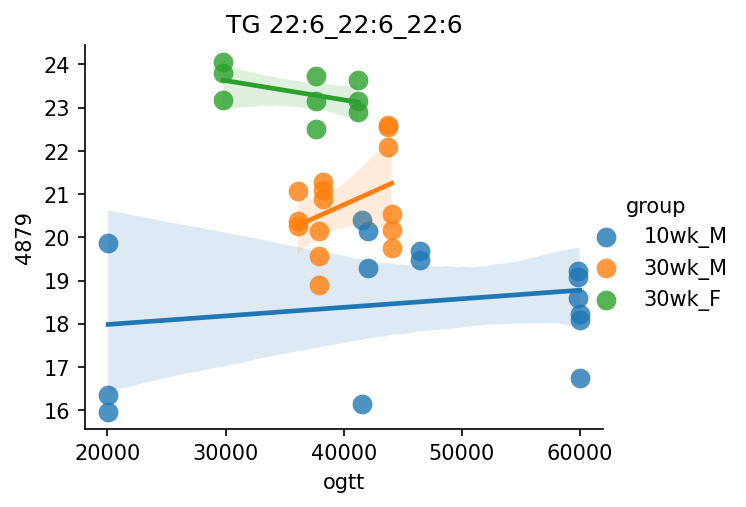

In [370]:
feature = '4879'
# fig, ax = plt.subplots(dpi=300, figsize=(4, 3))
sns.lmplot(
    data=df, y=feature, x='ogtt',
    hue='group', 
    scatter_kws=dict(lw=0, s=90)
)
fig = plt.gcf()
fig.set_dpi(150)
fig.set_size_inches(5, 3)
fig.set_facecolor('white')
plt.title(fr.loc[int(feature), 'Identification'])
# for animal in animal_subset:
#     if apval.loc[animal, 'sex'] == 'F':
#         plt.axvline(apval.loc[animal, 'OGTT(AUC)'], color='0.1', lw=0.5)

In [632]:
# dil_1700s = fr.filter(regex='uL_dil').filter(regex='1700s').columns
# print(dil_1700s)
# qc_dil_name = [
#     'BJA-Nilerat-20220915_lipid_1700s_QC25uL_dil.raw (F4)',
#     'BJA-Nilerat-20220915_lipid_1700s_QC50uL_dil.raw (F5)',
#     'BJA-Nilerat-20220915_lipid_1700s_QC100uL_dil.raw (F6)',
#     'BJA-Nilerat-20220915_lipid_1700s_QC150uL_dil.raw (F15)',
#     'BJA-Nilerat-20220915_lipid_1700s_QC200uL_dil.raw (F16)']
# qc_dil_short = [
#     '1700s_QCdil_025',
#     '1700s_QCdil_050',
#     '1700s_QCdil_100',
#     '1700s_QCdil_150',
#     '1700s_QCdil_200',]

# fr.rename({long: short for long, short in zip(qc_dil_name, qc_dil_short)}, axis=1, inplace=True)

# qc_name = fr.filter(regex='1700s_QC100').filter(regex='rep').columns
# print(qc_name)
# fr.rename({long: short for long, short in zip(qc_name, ['1700s_QC' + str(x) for x in range(1, 9)])},
#           axis=1, inplace=True)

Index([], dtype='object')
Index([], dtype='object')


is monotonic: True
Mean squared error: 0.1228165964803349


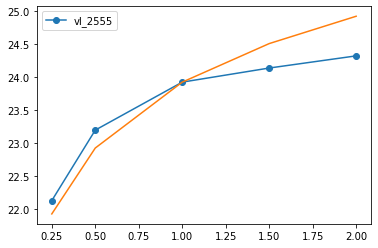

In [912]:
# sample = fr.sample(1).loc[:, qc_dil_short].T
# sample.index = [0.25, 0.50, 1, 1.50, 2.00]
# print('is monotonic:', strictly_increasing(sample.values))

# sample.plot(kind='line', style='o-')

# dil100 = sample.loc[1].values[0]
# theoretical_dil = [dil100-2, dil100-1, dil100, dil100 + 0.585, dil100+1]
# plt.plot(sample.index, theoretical_dil)
# # for dil in theoretical_dil: 
# #     plt.axhline(dil, color='gray', zorder=-10)
# mse = mean_squared_error(y_true=theoretical_dil, y_pred=sample.values)
# print('Mean squared error:', mse)

# dil50_value = sample.loc[0.5].values[0]
# plt.axhline(dil50_value, color='gray', zorder=-10)
# plt.axhline(dil50_value - 1, color='gray', zorder=-10)
# plt.axhline(dil50_value + 1, color='gray', zorder=-10)
# plt.axhline(dil50_value + 1.585, color='gray', zorder=-10)  # np.log2(150) - np.log2(50)  = 1.585
# plt.axhline(dil50_value + 2, color='gray', zorder=-10)



## Quant boxplots across runs

In [1691]:
data_cols = fg.loc[fg['validation'] & fg['sufficient_sample']].index
rawdata = (fr
 .filter(regex='_RBG')
 .loc[:, data_cols]
 .join(fr[['Identification', 'Lipid Class', 'Features Found']])
)
rawdata

KeyError: "['1061_10_RBG', '1061_8_RBG', '1075_10_RBG', '1075_8_RBG', '1075_9_RBG', '1081_10_RBG', '1081_8_RBG', '1094_8_RBG', '1095_8_RBG', '1095_9_RBG', '1096_8_RBG', '1788_34_RBG', '1789_34_RBG', '1798_32_RBG', '1809_31_RBG', '1810_31_RBG', '1811_31_RBG', '1812_31_RBG', '1857_26_RBG'] not in index"

In [114]:
## Input observations in rows, features in columns
def make_pca(normdf, cohorts=['10wk', '30wk'], **kwargs):
    ss = StandardScaler()
    scaled = ss.fit_transform(normdf)
    scaled = pd.DataFrame(scaled, columns=normdf.columns, index=normdf.index)
    pca = PCA()
    pca_data = pca.fit_transform(scaled)
    pca_data = pd.DataFrame(pca_data, 
                            columns=[f'pc_{x}' for x in range(1, pca.n_components_+1)],
                            index=normdf.index)
    
    pca_data = pca_data.join(fg[['cohort', 'animal']])
    pca_data['animal'] = pca_data['animal'].astype('str')

    fig1, ax1 = plt.subplots(dpi=150, figsize=(5, 4))
    pca_data = pca_data.loc[pca_data['cohort'].isin(cohorts)]
    sns.scatterplot(
        data=pca_data, ax=ax1,
        x='pc_1', y='pc_2', style='cohort',
        hue='animal', **kwargs
    )
    plt.legend(loc=(1.02, 0), fontsize=6)
    
    
    run_order = fg.loc[fg['validation'] & fg['quant_file']].sort_values('lipid_run_order').index
    fig2, ax2 = plt.subplots(dpi=250, figsize=(9, 3))
    sns.boxenplot(
        data=normdf.loc[run_order].T, ax=ax2,
    )
    ax2.tick_params(rotation=90, labelsize=6)
    return pca_data, ax1, ax2

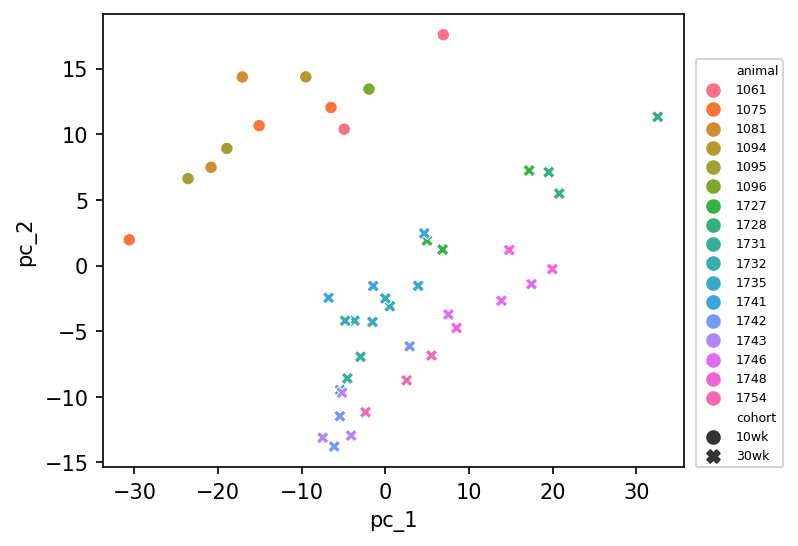

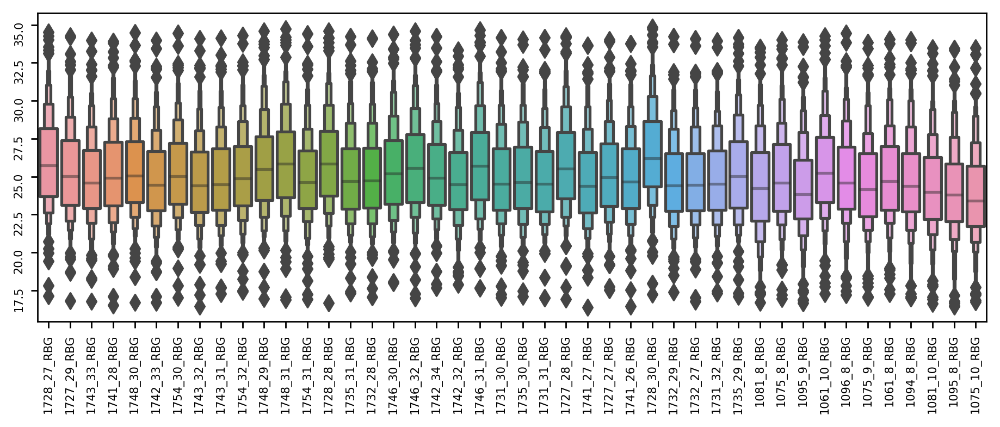

In [208]:
subset_ids = rawdata.loc[(fr['Identification'].notna()) & (fr['Features Found'] > 30), data_cols]
_ = make_pca(subset_ids.T)

In [1508]:
# med_of_med_diff = subset_ids.median(axis=0) - subset_ids.median(axis=0).median()
# med_norm = subset_ids.sub(med_of_med_diff, axis=1).T
# med_norm
# pca_data, ax1, ax2 = make_pca(med_norm, alpha=0.7)
# for i, row in pca_data.iterrows():
#     ax1.text(row['pc_1'], row['pc_2'], str(i)[:-4], ha='center', va='center', fontsize=5)

In [1509]:
# filt = (med_norm
#  .T
#  .loc[fr['Identification'].notna() & (fr['Features Found'] > 30)]
# #  .sort_values('Area (max)', ascending=False)
#  .loc[:, data_cols]
#  .T
#  .join(fg[['animal', 'sex', 'cohort', 'ogtt']])
# )
# # filt = filt.loc[filt['cohort'] == '30wk']
# filt['groups'] = filt['cohort'] + ' ' + filt['sex']
# filt